In [1]:
import pandas as pd
import numpy as np
# Reading the CSV file "impure_dataset_final.csv" into a pandas DataFrame
data = pd.read_csv("impure_dataset_final.csv");

# Displaying the first 5 rows of the DataFrame
data.head(5)

,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,SugarConsumption,Diabetes
0,4,Male,0,1,26,Non Smoker,0,1.0,Does not Eat,Eat,0.0,good,5.0,30.0,No,No,1,High,No
1,12,Male,1,1,26,Smoker,0,0.0,Eat,Does not Eat,0.0,good,0.0,0.0,No,Yes,1,High,No
2,13,Male,0,1,26,Non Smoker,0,1.0,Eat,No,0.0,excellent,0.0,10.0,No,No,0,High,No
3,11,Male,1,1,28,Smoker,0,1.0,Eat,Eat,0.0,good,0.0,3.0,No,No,1,High,No
4,8,Female,0,1,29,Smoker,0,1.0,Eat,Eat,0.0,very good,0.0,0.0,No,No,0,High,No


In [2]:
# Displaying number of rows and columns in the DataFrame
data.shape

(70707, 19)

In [3]:
# Creating a dictionary to store key information about the dataset
dataset_info = {
    "Number of rows in the dataset are": data.shape[0],
    "Number of columns in the dataset are ": data.shape[1],
    "Names of the columns": data.columns.tolist()
}

dataset_info

{'Number of rows in the dataset are': 70707,
 'Number of columns in the dataset are ': 19,
 'Names of the columns': ['Age',
  'Sex',
  'HighChol',
  'CholCheck',
  'BMI',
  'Smoker',
  'HeartDiseaseorAttack',
  'PhysActivity',
  'Fruits',
  'Veggies',
  'HvyAlcoholConsump',
  'GenHlth',
  'MentHlth',
  'PhysHlth',
  'DiffWalk',
  'Stroke',
  'HighBP',
  'SugarConsumption',
  'Diabetes']}

In [4]:
# Printing the metadata of the dataset
data.describe()

,Age,HighChol,CholCheck,HeartDiseaseorAttack,PhysActivity,HvyAlcoholConsump,MentHlth,PhysHlth,HighBP
count,70707.000000,70707.000000,70707.000000,70707.000000,70511.000000,69775.000000,69759.000000,69743.000000,70707.000000
mean,8.581116,0.525747,0.975264,0.147878,0.703124,0.042809,3.760447,5.810719,0.563466
std,2.864696,0.499340,0.155320,0.354981,0.456885,0.202428,8.165618,10.060229,0.495959
min,-31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,9.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
75%,11.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2.000000,6.000000,1.000000
max,13.000000,1.000000,1.000000,1.000000,1.000000,1.000000,30.000000,30.000000,1.000000


## Data Cleaning Steps

### 1. Removing duplicate rows

In [5]:
# Step 1: Removing duplicate rows
print("Number of duplicated rows in the dataset are:", data.duplicated().sum())
data = data.drop_duplicates()
print("Number of rows after removing duplicated data are:", len(data))

Number of duplicated rows in the dataset are: 5554
Number of rows after removing duplicated data are: 65153


### 2. Removing missing values

In [6]:
# Step 2: Remove missing values
# Calculates the number of non-null values in every column
data.isnull().sum()

Age                        0
Sex                        0
HighChol                   0
CholCheck                  0
BMI                      987
Smoker                  1013
HeartDiseaseorAttack       0
PhysActivity             196
Fruits                   232
Veggies                  215
HvyAlcoholConsump        932
GenHlth                  989
MentHlth                 947
PhysHlth                 964
DiffWalk                 227
Stroke                     0
HighBP                     0
SugarConsumption           0
Diabetes                   0
dtype: int64

In [7]:
# Printing the total number of null values in every column
total_missing_values = data.isnull().sum().sum()
print("Total number of missing values in the dataset are:", total_missing_values)

Total number of missing values in the dataset are: 6702


In [8]:
# Removing the columns with missing values less than 300
missingvalues_less_than_300 = data.isnull().sum() < 300
columns_to_drop = data.columns[missingvalues_less_than_300]
data.dropna(subset=columns_to_drop, inplace=True)
print("Number of rows after removing columns with missing values less than 300 are:", len(data))

Number of rows after removing columns with missing values less than 300 are: 64286


### 3.Remove inconsistencies

In [9]:
# Step 3: Remove inconsistencies
for column in data.columns:
    unique_items = data[column].unique()
    print(f"Unique items in '{column}':", unique_items)

Unique items in 'Age': [  4  12  13  11   8   1   6   3  -1   7  10   9   5   2  -9 -31 -12 -21
  -3  -2  -7 -15 -19]
Unique items in 'Sex': ['Male' 'Female' 'M' 'F']
Unique items in 'HighChol': [0 1]
Unique items in 'CholCheck': [1 0]
Unique items in 'BMI': ['26' '28' '29' '18' '31' '32' '27' '24' '21' '58' '30' '20' '22' '38'
 '40' '25' '36' '47' '19' '37' '41' '23' '34' '35' '42' '17' '33' '44' nan
 '15' '52' '69' '56' '45' '39' '92' '98' '50' '46' '79' '48' '16' '63'
 '72' '54' '49' '68' '43' '84' '31.0 kg/m2' '53' '73' '76' '55' '51' '75'
 '57' '25.0 kg/m2' '60' '33.0 kg/m2' '77' '82' '67' '71' '61' '14' '81'
 '59' '29.0 kg/m2' '24.0 kg/m2' '86' '28.0 kg/m2' '13' '87' '65' '95' '89'
 '62' '64' '66' '85' '70' '83' '38.0 kg/m2' '34.0 kg/m2' '80' '21.0 kg/m2'
 '78' '26.0 kg/m2']
Unique items in 'Smoker': ['Non Smoker' 'Smoker' nan]
Unique items in 'HeartDiseaseorAttack': [0 1]
Unique items in 'PhysActivity': [1. 0.]
Unique items in 'Fruits': ['Does not Eat' 'Eat' 'No' 'Yes']
Unique i

In [10]:
data['Sex'] = data['Sex'].replace(['Male', 'Female'], ['M', 'F'])
data['Fruits'] = data['Fruits'].replace(['Yes', 'No'], ['Eat', 'Does not Eat'])
data['Veggies'] = data['Veggies'].replace(['Yes', 'No'], ['Eat', 'Does not Eat'])
data['DiffWalk'] = data['DiffWalk'].replace(['Yes', 'No'], ['Y', 'N'])
data['Stroke'] = data['Stroke'].replace(['Yes', 'No'], ['Y', 'N'])
data['Diabetes'] = data['Diabetes'].replace(['Yes', 'No'], ['Y', 'N'])
data['BMI'] = data['BMI'].astype(str).str.replace(' kg/m2', '').astype(float)
for column in data.columns:
    unique_items = data[column].unique()
    print(f"Unique items in '{column}':", unique_items)

Unique items in 'Age': [  4  12  13  11   8   1   6   3  -1   7  10   9   5   2  -9 -31 -12 -21
  -3  -2  -7 -15 -19]
Unique items in 'Sex': ['M' 'F']
Unique items in 'HighChol': [0 1]
Unique items in 'CholCheck': [1 0]
Unique items in 'BMI': [26. 28. 29. 18. 31. 32. 27. 24. 21. 58. 30. 20. 22. 38. 40. 25. 36. 47.
 19. 37. 41. 23. 34. 35. 42. 17. 33. 44. nan 15. 52. 69. 56. 45. 39. 92.
 98. 50. 46. 79. 48. 16. 63. 72. 54. 49. 68. 43. 84. 53. 73. 76. 55. 51.
 75. 57. 60. 77. 82. 67. 71. 61. 14. 81. 59. 86. 13. 87. 65. 95. 89. 62.
 64. 66. 85. 70. 83. 80. 78.]
Unique items in 'Smoker': ['Non Smoker' 'Smoker' nan]
Unique items in 'HeartDiseaseorAttack': [0 1]
Unique items in 'PhysActivity': [1. 0.]
Unique items in 'Fruits': ['Does not Eat' 'Eat']
Unique items in 'Veggies': ['Eat' 'Does not Eat']
Unique items in 'HvyAlcoholConsump': [ 0.  1. nan]
Unique items in 'GenHlth': ['good' 'excellent' 'very good' 'fair' 'poor' nan]
Unique items in 'MentHlth': [ 5.  0.  7.  3.  4.  2. 30. 20.  1. 15

### 4. Imputing null values with mode and mean

In [11]:
# Step 4: Filling null values with mode and mean
for col in data.columns:
  if data[col].isnull().any():
    if data[col].dtype == 'object':
      data[col].fillna(data[col].mode()[0], inplace=True)
    else:
      data[col].fillna(data[col].mean(), inplace=True)
print("After imputing the null values in the dataset are:", data.isnull().sum().sum())

After imputing the null values in the dataset are: 0


### 5. Removing negative values

In [12]:
# Step 5: Removing negative values in age column
print("Number of negative values in the 'Age' column:", (data['Age'] < 0).sum())
data = data[data['Age'] >= 0]
print("Number of rows after removing negative values:", len(data))

Number of negative values in the 'Age' column: 11
Number of rows after removing negative values: 64275


### 6. Creating new attribute

In [13]:
# Step 6: Creating new attribute AgeGroup to classify as kids and teens
age_bins = [0, 10, 100]
age_labels = ['Kid', 'Teen']
data['Age_Group'] = pd.cut(data['Age'], bins=age_bins, labels=age_labels)
print("Number of kids and teens in the dataset are:")
print(data['Age_Group'].value_counts())
data.head(5)

Number of kids and teens in the dataset are:
Age_Group
Kid     46796
Teen    17479
Name: count, dtype: int64


,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,SugarConsumption,Diabetes,Age_Group
0,4,M,0,1,26.0,Non Smoker,0,1.0,Does not Eat,Eat,0.0,good,5.0,30.0,N,N,1,High,N,Kid
1,12,M,1,1,26.0,Smoker,0,0.0,Eat,Does not Eat,0.0,good,0.0,0.0,N,Y,1,High,N,Teen
2,13,M,0,1,26.0,Non Smoker,0,1.0,Eat,Does not Eat,0.0,excellent,0.0,10.0,N,N,0,High,N,Teen
3,11,M,1,1,28.0,Smoker,0,1.0,Eat,Eat,0.0,good,0.0,3.0,N,N,1,High,N,Teen
4,8,F,0,1,29.0,Smoker,0,1.0,Eat,Eat,0.0,very good,0.0,0.0,N,N,0,High,N,Kid


### 7. Data type conversion

In [14]:
# Step 7: Data type conversion for BMI and Age column from float to int
data['BMI'] = data['BMI'].astype(int)
data['Age'] = data['Age'].astype(int)
data.head(5)

,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,SugarConsumption,Diabetes,Age_Group
0,4,M,0,1,26,Non Smoker,0,1.0,Does not Eat,Eat,0.0,good,5.0,30.0,N,N,1,High,N,Kid
1,12,M,1,1,26,Smoker,0,0.0,Eat,Does not Eat,0.0,good,0.0,0.0,N,Y,1,High,N,Teen
2,13,M,0,1,26,Non Smoker,0,1.0,Eat,Does not Eat,0.0,excellent,0.0,10.0,N,N,0,High,N,Teen
3,11,M,1,1,28,Smoker,0,1.0,Eat,Eat,0.0,good,0.0,3.0,N,N,1,High,N,Teen
4,8,F,0,1,29,Smoker,0,1.0,Eat,Eat,0.0,very good,0.0,0.0,N,N,0,High,N,Kid


### 8. Creating BMI_Group 

In [15]:
# Step 8: Creating new attribute "BMI_Group"
bmi_bins = [18, 25, 30, 40, 70]
bmi_labels = ['UnderWeight', 'HealthyWeight', 'OverWeight', 'Obese']
data['BMI_Group'] = pd.cut(data['BMI'], bins=bmi_bins, labels=bmi_labels)
print("Number of BMI groups in the dataset are:")
print(data['BMI_Group'].value_counts())
data.head(5)

Number of BMI groups in the dataset are:
BMI_Group
HealthyWeight    22293
OverWeight       20612
UnderWeight      15842
Obese             4764
Name: count, dtype: int64


,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,SugarConsumption,Diabetes,Age_Group,BMI_Group
0,4,M,0,1,26,Non Smoker,0,1.0,Does not Eat,Eat,...,good,5.0,30.0,N,N,1,High,N,Kid,HealthyWeight
1,12,M,1,1,26,Smoker,0,0.0,Eat,Does not Eat,...,good,0.0,0.0,N,Y,1,High,N,Teen,HealthyWeight
2,13,M,0,1,26,Non Smoker,0,1.0,Eat,Does not Eat,...,excellent,0.0,10.0,N,N,0,High,N,Teen,HealthyWeight
3,11,M,1,1,28,Smoker,0,1.0,Eat,Eat,...,good,0.0,3.0,N,N,1,High,N,Teen,HealthyWeight
4,8,F,0,1,29,Smoker,0,1.0,Eat,Eat,...,very good,0.0,0.0,N,N,0,High,N,Kid,HealthyWeight


### 9. Label Encoding

In [16]:
# Step 9: Label Encoding to convert categorical values into numerical labels
from sklearn.preprocessing import LabelEncoder
lbl_encod = LabelEncoder()

for column in data.columns:
  if data[column].dtype == 'object' or 'category':
    data[column] = lbl_encod.fit_transform(data[column])
data.head(5)

,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,SugarConsumption,Diabetes,Age_Group,BMI_Group
0,3,1,0,1,13,0,0,1,0,1,...,2,6,31,0,0,1,0,0,0,0
1,11,1,1,1,13,1,0,0,1,0,...,2,0,0,0,1,1,0,0,1,0
2,12,1,0,1,13,0,0,1,1,0,...,0,0,11,0,0,0,0,0,1,0
3,10,1,1,1,15,1,0,1,1,1,...,2,0,3,0,0,1,0,0,1,0
4,7,0,0,1,16,1,0,1,1,1,...,4,0,0,0,0,0,0,0,0,0


### 10. Feature importance

In [17]:
# Step 10: Dropping Features
# Dropping SugarComputation as this feature does not correlate with the target variable and it might not contribute to improving the model's performance
print("Number of High and Low values in SugarComputation:")
print(data['SugarConsumption'].value_counts())
data = data.drop(columns=['SugarConsumption'])
data.head(5)

Number of High and Low values in SugarComputation:
SugarConsumption
0    64271
1        4
Name: count, dtype: int64


,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,Diabetes,Age_Group,BMI_Group
0,3,1,0,1,13,0,0,1,0,1,0,2,6,31,0,0,1,0,0,0
1,11,1,1,1,13,1,0,0,1,0,0,2,0,0,0,1,1,0,1,0
2,12,1,0,1,13,0,0,1,1,0,0,0,0,11,0,0,0,0,1,0
3,10,1,1,1,15,1,0,1,1,1,0,2,0,3,0,0,1,0,1,0
4,7,0,0,1,16,1,0,1,1,1,0,4,0,0,0,0,0,0,0,0


### 11. Remove outliers

In [18]:
# Step 11: Removing outliers
def remove_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    print(f"Lower bound for '{column}': {lower_bound}")
    print(f"Upper bound for '{column}': {upper_bound}")
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

columns_to_clean = ['BMI', 'Age']
for col in columns_to_clean:
    data = remove_outliers(data, col)

print("Number of rows after removing outliers:", len(data))


Lower bound for 'BMI': 0.0
Upper bound for 'BMI': 32.0
Lower bound for 'Age': 0.0
Upper bound for 'Age': 16.0
Number of rows after removing outliers: 62168


## Exploratory Data Analysis

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

### 1. Box Plot

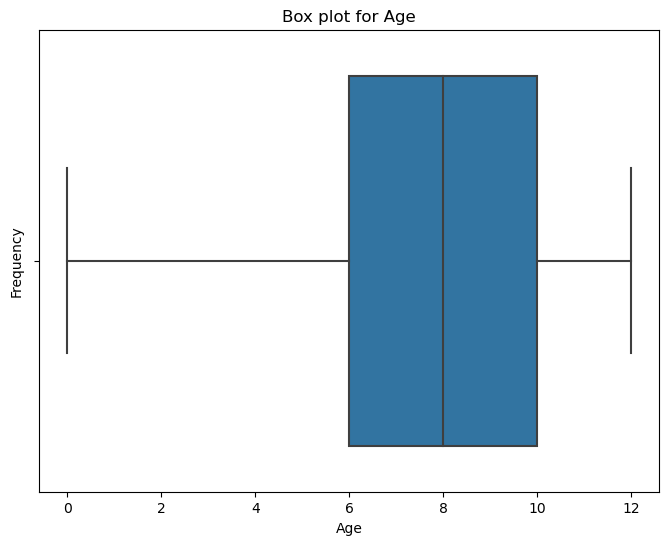

In [20]:
# 1. Box Plot

# Box Plot for age
plt.figure(figsize=(8, 6))
# Creating a box plot for the "Age" column in the dataset
sns.boxplot(data=data, x="Age")
# label for x-axis and y-axis
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Box plot for Age")
# Display the plot
plt.show()


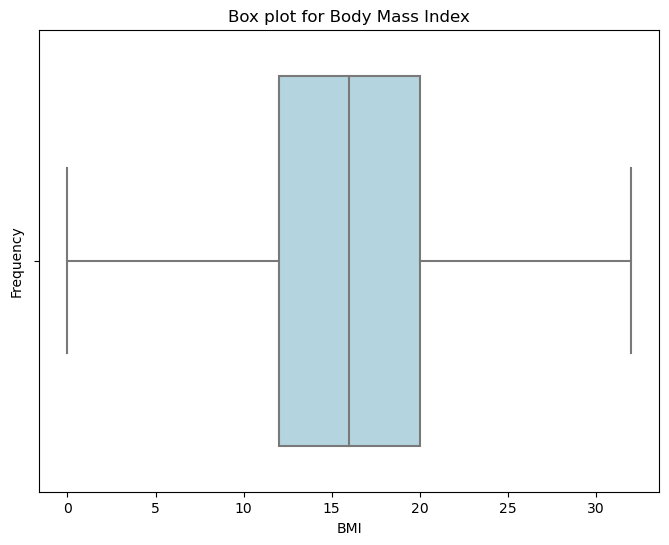

In [21]:
# BOX PLOT for BMI
# Creating a box plot for the "BMI" column
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, x="BMI", color="lightBlue")
# label for x-axis and y-axis
plt.xlabel("BMI")
plt.ylabel("Frequency")
plt.title("Box plot for Body Mass Index")
# Display the plot
plt.show()



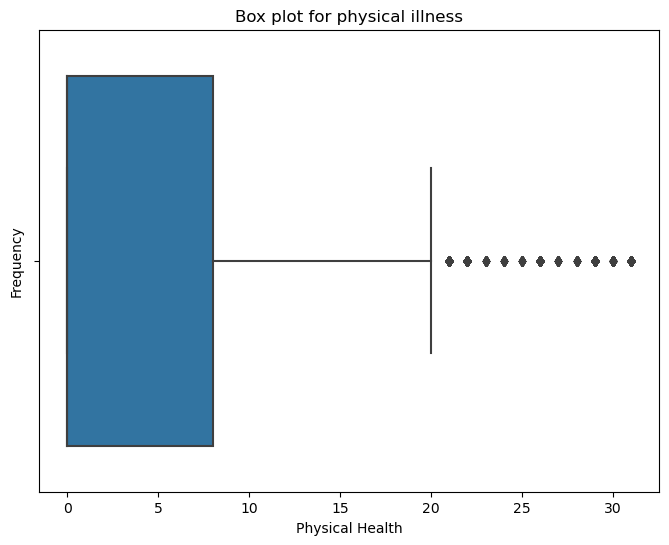

In [22]:
# Box Plot for physical health
# Create a box plot for the "PhysHlth" column in the dataset
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, x="PhysHlth")
# label for x-axis and y-axis
plt.xlabel("Physical Health")
plt.ylabel("Frequency")
plt.title("Box plot for physical illness")
# Display the plot
plt.show()



### 2. Stacked Bar Chart

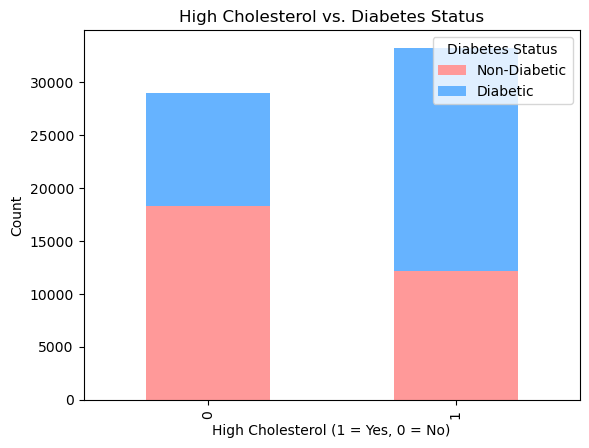

In [23]:
# 2. Stacked Bar Chart

# Bar Chart for highChol vs Diabities
grouped = data.groupby(['HighChol', 'Diabetes']).size().unstack()

# Defineing Colors
colors =  ['#ff9999', '#66b3ff']
# Creating stacked bar chart
grouped.plot(kind='bar', stacked=True, color=colors)
# Label x and y axis
plt.xlabel('High Cholesterol (1 = Yes, 0 = No)')
plt.ylabel('Count')
# Add title
plt.title('High Cholesterol vs. Diabetes Status')
# Add a legend to differentiate between non-diabetic and diabetic categories.
plt.legend(title='Diabetes Status', labels=['Non-Diabetic', 'Diabetic'])
plt.show()


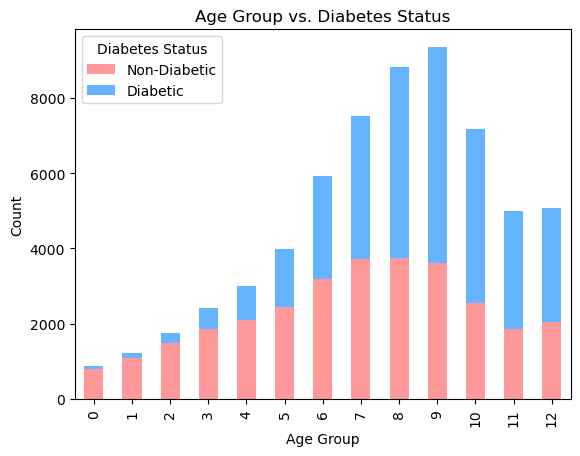

In [24]:
# Bar Chart for Age vs Diabetes

# Group and count the data
grouped = data.groupby(['Age', 'Diabetes']).size().unstack()
# Define colors
colors = ['#ff9999', '#66b3ff']
# Plot with bar chart
grouped.plot(kind='bar', stacked=True, color=colors)
# Label X,y axis and title
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.title('Age Group vs. Diabetes Status')
# Add legend
plt.legend(title='Diabetes Status', labels=['Non-Diabetic', 'Diabetic'])
plt.show()



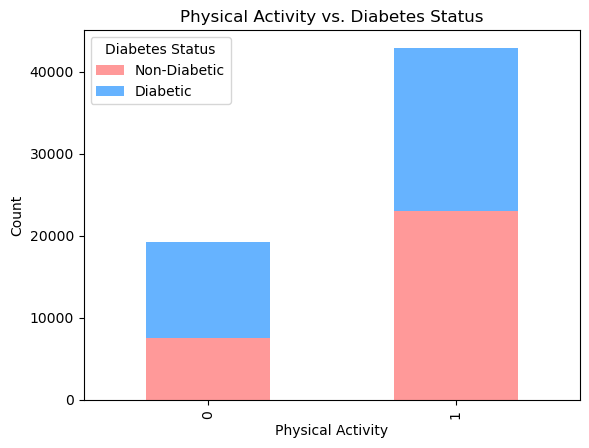

In [25]:
# Bar Chart for Physical Activity vs Diabetes

# Group and count the data
grouped = data.groupby(['PhysActivity', 'Diabetes']).size().unstack()

# Defining colors
colors = ['#ff9999', '#66b3ff']
# Plot bar chart
grouped.plot(kind='bar', stacked=True, color=colors)
# Label X,Y axis and title
plt.xlabel('Physical Activity')
plt.ylabel('Count')
plt.title('Physical Activity vs. Diabetes Status')
# Add legend
plt.legend(title='Diabetes Status', labels=['Non-Diabetic', 'Diabetic'])
# Display the plot
plt.show()


### 3. Bar Chart

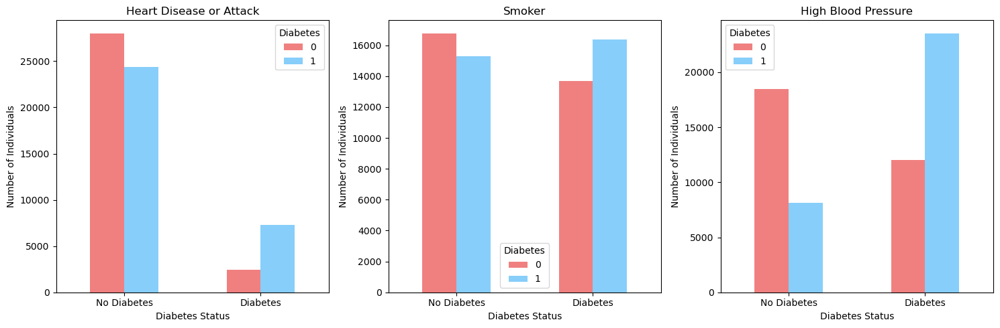

In [26]:
# 3. Bar Chart

# Calculating the number of individuals with diabetes in each category
diabetes_counts = {
    'Heart Disease or Attack': data.groupby('HeartDiseaseorAttack')['Diabetes'].value_counts().unstack().fillna(0),
    'Smoker': data.groupby('Smoker')['Diabetes'].value_counts().unstack().fillna(0),
    'High Blood Pressure': data.groupby('HighBP')['Diabetes'].value_counts().unstack().fillna(0)
}

# Set up the plot
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot bar charts for each category
for ax, (title, counts) in zip(axs, diabetes_counts.items()):
    counts.plot(kind='bar', ax=ax, color=['lightcoral', 'lightskyblue'])
    ax.set_title(title)
    ax.set_xlabel('Diabetes Status')
    ax.set_ylabel('Number of Individuals')
    ax.set_xticklabels(['No Diabetes', 'Diabetes'], rotation=0)

plt.tight_layout()
plt.show()


### 4. Histogram

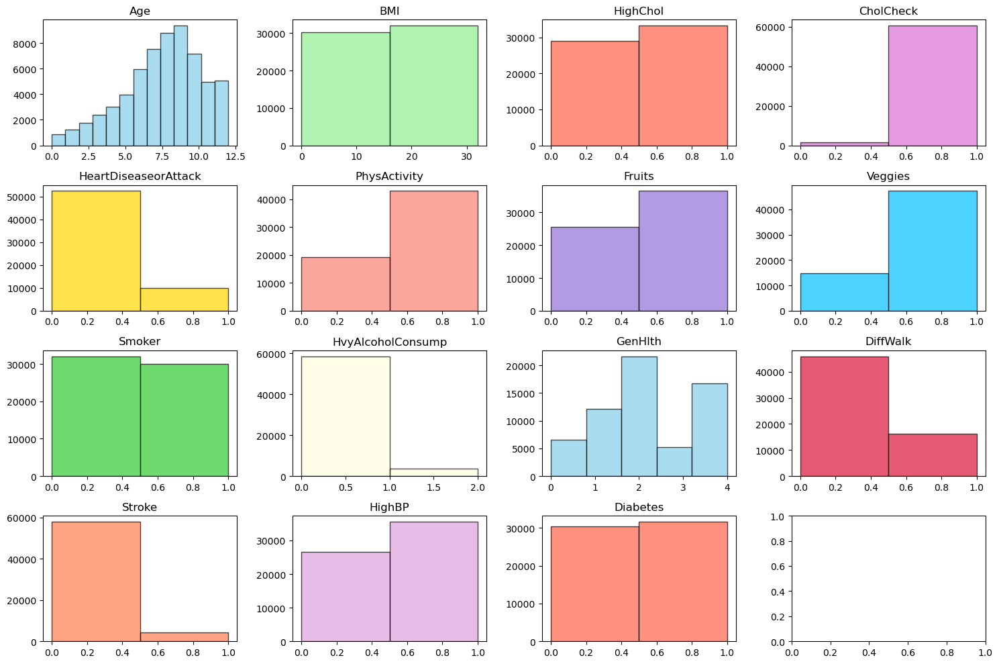

In [27]:
# 4. Histogram

# Define data for plotting
hist_data = [
    ('Age', 13, 'skyblue'),
    ('BMI', 2, 'lightgreen'),
    ('HighChol', 2, 'tomato'),
    ('CholCheck', 2, 'orchid'),
    ('HeartDiseaseorAttack', 2, 'gold'),
    ('PhysActivity', 2, 'salmon'),
    ('Fruits', 2, 'mediumpurple'),
    ('Veggies', 2, 'deepskyblue'),
    ('Smoker', 2, 'limegreen'),
    ('HvyAlcoholConsump', 2, 'lightyellow'),
    ('GenHlth', 5, 'skyblue'),
    ('DiffWalk', 2, 'crimson'),
    ('Stroke', 2, 'coral'),
    ('HighBP', 2, 'plum'),
    ('Diabetes', 2, 'tomato')
]

fig, axs = plt.subplots(4, 4, figsize=(15, 10))

# Loop through the histogram data
for ax, (title, bins, color) in zip(axs.flatten(), hist_data):
    ax.hist(data[title], bins=bins, color=color, alpha=0.7, edgecolor='black')
    ax.set_title(title)

plt.tight_layout()
plt.show()


### 5. Pie chart

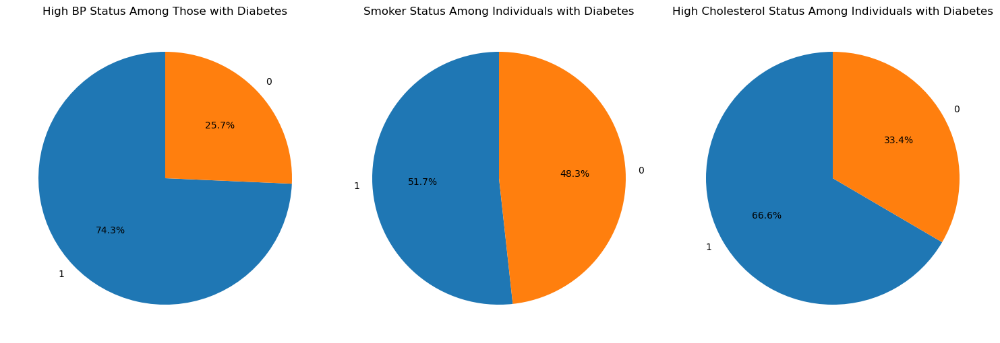

In [28]:
# 5. Pie chart

# 1. Heavy BP Status Among Those with Diabetes
# Filter the data for individuals with diabetes and count the frequency of HighBP status
diabetes_bp_counts = data[data['Diabetes'] == 1]['HighBP'].value_counts()
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.pie(diabetes_bp_counts, labels=diabetes_bp_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('High BP Status Among Those with Diabetes')

# 2. Smoker Status Among Individuals with Diabetes
# Filter the data for individuals with diabetes and count the frequency of smoker status
diabetes_smoker_counts = data[data['Diabetes'] == 1]['Smoker'].value_counts()
plt.subplot(1, 3, 2)
plt.pie(diabetes_smoker_counts, labels=diabetes_smoker_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Smoker Status Among Individuals with Diabetes')

# 3. High Cholesterol Status Among Individuals with Diabetes
# Filter the data for individuals with diabetes and count the frequency of HighChol status (1 for High Cholesterol, 0 for Normal Cholesterol)
diabetes_chol_counts = data[data['Diabetes'] == 1]['HighChol'].value_counts()
plt.subplot(1, 3, 3)
plt.pie(diabetes_chol_counts, labels=diabetes_chol_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('High Cholesterol Status Among Individuals with Diabetes')

# Adjust layout to prevent overlap and improve readability.
plt.tight_layout()
plt.show()


### 6. Heatmap

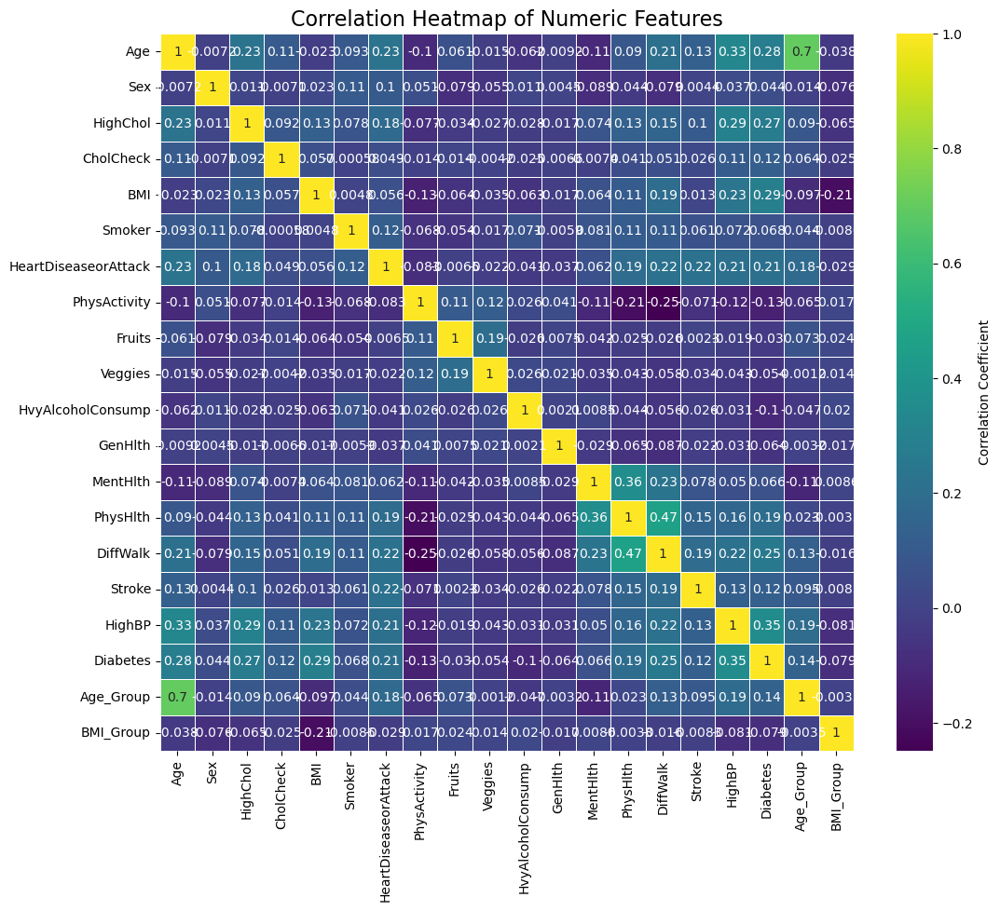

In [29]:
# 6. Heatmap

# Filter to include only numeric columns
numeric_data = data.select_dtypes(include=['number'])

# Calculate the correlation matrix
correlation_matrix = numeric_data.corr()

# Creating a heatmap for the correlation
plt.figure(figsize=(12, 10))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', linewidths=0.5, cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation Heatmap of Numeric Features', fontsize=16)
plt.show()



### 7. Density plot

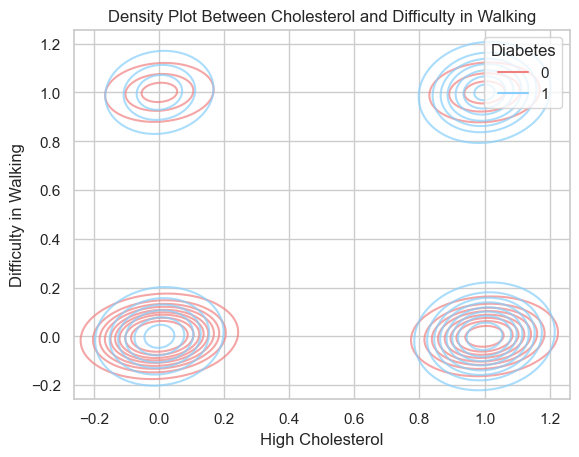

In [30]:
# 7. Density plot
sns.set(style="whitegrid")

# Density plot by considering HighChol and DiffWalk and assign colors for Diabetes
sns.kdeplot(data=data, x="HighChol", y="DiffWalk", hue="Diabetes",
            palette=["lightcoral", "lightskyblue"], alpha=0.7)

# Add labels and titles for the graph
plt.xlabel("High Cholesterol")
plt.ylabel("Difficulty in Walking")
plt.title("Density Plot Between Cholesterol and Difficulty in Walking")

#Plot the graph
plt.show()


### 8. Pairplot

c:\Users\sushm\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


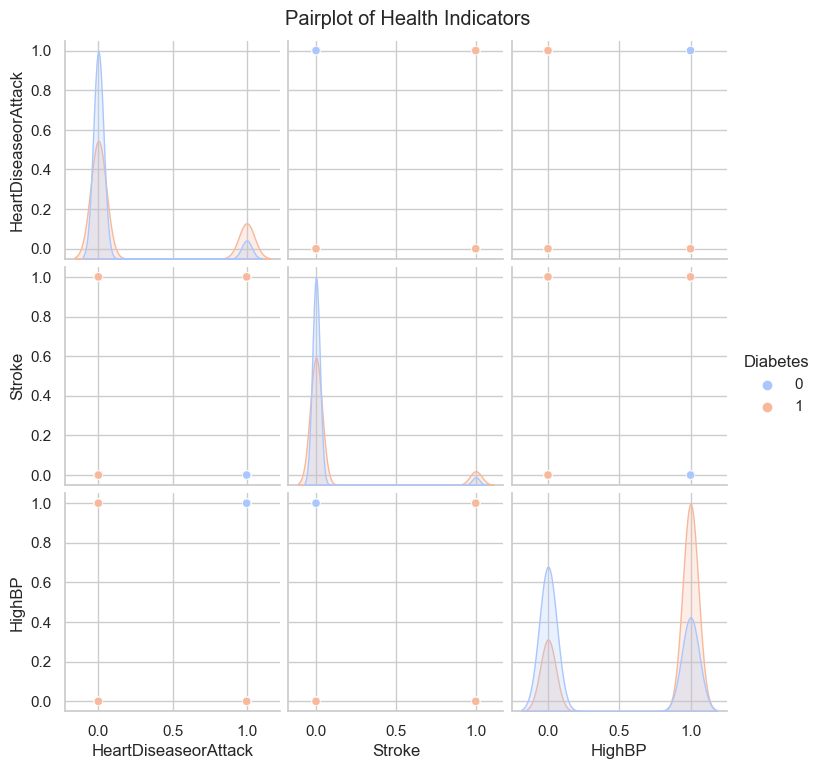

In [31]:
# 8. Pairplot of Health Indicators

# Create subset of health indicator features
subset_columns = ['HeartDiseaseorAttack', 'Stroke', 'HighBP', 'Diabetes']

# Paiplot with KDE
sns.pairplot(data[subset_columns], hue='Diabetes', palette='coolwarm', diag_kind='kde')
plt.suptitle('Pairplot of Health Indicators', y=1.02)

# Plot the graph
plt.show()

### 9. Scatter plot

In [32]:
# 9. Scatter plot of Age vs BMI
fig = px.scatter(data,
                 x='Age',
                 y='BMI',
                 color='HeartDiseaseorAttack',
                 title='Animated Scatter Plot of Age vs BMI Over Time',
                 labels={'HeartDiseaseorAttack': 'Heart Disease'})

#Plot the graph
fig.show()


### 10. Bar graph 

In [33]:
# 10. Bar graph of correlations with Diabetes

# Calculate correlation with Diabetes feature
correlation_values = data.drop(columns='Diabetes').corrwith(data['Diabetes']).reset_index()
correlation_values.columns = ['Feature', 'Correlation']

fig = px.bar(correlation_values,
             x='Feature',
             y='Correlation',
             title='Correlation with Diabetes',
             color='Correlation',
             color_continuous_scale='Viridis')

# Update the layout of the plot
fig.update_layout(xaxis_title='Features', yaxis_title='Correlation Coefficient',
                  xaxis_tickangle=-45, template='plotly_white')

# Plot the graph
fig.show()


### 11. 3D Scatter plot

In [34]:
# 11. 3D Scatter plot of GEnHlth, MentHith vs BMI
fig = px.scatter_3d(data, x='GenHlth', y='MentHlth', z='BMI', color='BMI', title='3D Scatter Plot')
fig.update_traces(marker=dict(colorscale='Viridis', size=4))

fig.update_layout(width=800, height=600)

#Plot the graph
fig.show()

### 12. Stacked bar 

In [35]:
# 12. Stacked bar chart of Smoker Frequency with it's frequency(Count)
aggregated_data = data.groupby(['Age', 'Smoker']).size().reset_index(name='Frequency')

# Create an interactive stacked bar plot using Plotly Express
fig = px.bar(aggregated_data,
             x='Age',
             y='Frequency',
             color='Smoker',
             title='Smoker Status Across Age',
             labels={'Smoker': 'Smoker Status'},
             color_discrete_sequence=['#ff9999', '#66b3ff'])

# Update layout for better visuals
fig.update_layout(xaxis_title='Age',
                  yaxis_title='Frequency',
                  legend_title='Smoker Status')

# Add a range slider for Age
fig.update_xaxes(rangeslider_visible=True)

# Show the plot
fig.show()


### 13. Line graph 

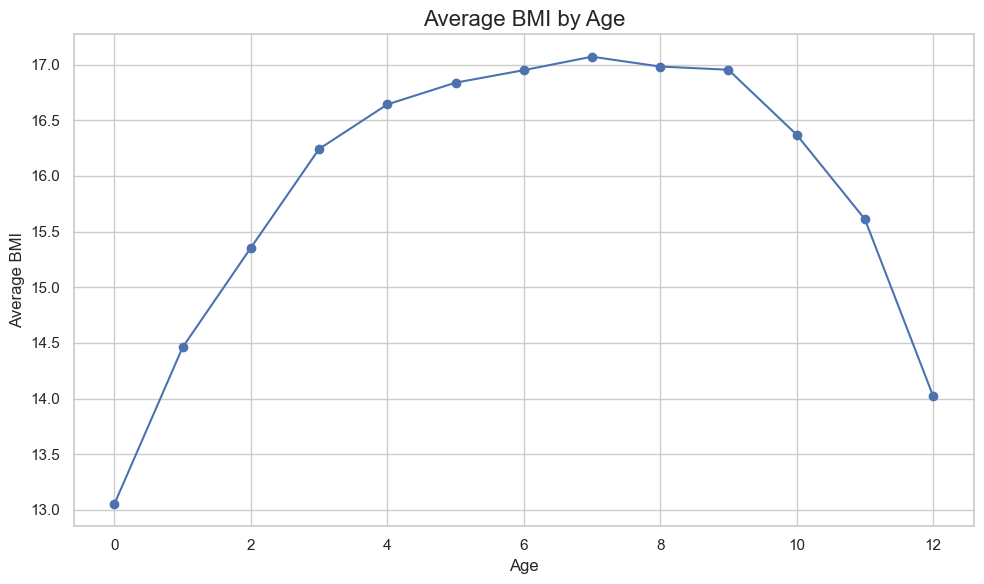

In [36]:
# 13. Line graph of BMI by Age

# Calculate the average BMI by Age
avg_bmi_age = data.groupby('Age')['BMI'].mean()

# Create a line plot for BMI vs Age
plt.figure(figsize=(10, 6))
plt.plot(avg_bmi_age.index, avg_bmi_age.values, marker='o', color='b')

# Set titles and labels
plt.title('Average BMI by Age', fontsize=16)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Average BMI', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()
